# Identifying Credit Card Default with Machine Learning

## Loading the data and managing data types

In [1]:
# Import necessary libraries

# Standard Libraries
import warnings
from io import StringIO
from datetime import date

# Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
import missingno
import pydotplus
from IPython.display import Image

# Data Manipulation and Analysis Libraries
import numpy as np
import pandas as pd
import yfinance as yf

# Machine Learning Libraries
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import (GridSearchCV, RandomizedSearchCV, StratifiedKFold, 
                                     cross_val_score, cross_validate, train_test_split)
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc

# Custom Modules
try:
    from chapter_8_utils import performance_evaluation_report
except ModuleNotFoundError:
    print("Warning: Custom utility modules not found. Make sure they are available in the working directory.")

# Visualization settings
plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

C:\Users\USER\AppData\Local\Temp\ipykernel_31048\2644328630.py:40: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


2. Load the data from the CSV file:

In [2]:
# Download Csv file from previous lecture

df = pd.read_csv('credit_card_default.csv', index_col=0, na_values='')
print(f'The DataFrame has {len(df)} rows and {df.shape[1]} columns.')
df.head()

The DataFrame has 30000 rows and 24 columns.


,limit_bal,sex,education,marriage,age,payment_status_sep,payment_status_aug,payment_status_jul,payment_status_jun,payment_status_may,...,bill_statement_jun,bill_statement_may,bill_statement_apr,previous_payment_sep,previous_payment_aug,previous_payment_jul,previous_payment_jun,previous_payment_may,previous_payment_apr,default_payment_next_month
0,20000,Female,University,Married,24.0,Payment delayed 2 months,Payment delayed 2 months,Payed duly,Payed duly,Unknown,...,0,0,0,0,689,0,0,0,0,1
1,120000,Female,University,Single,26.0,Payed duly,Payment delayed 2 months,Unknown,Unknown,Unknown,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,Female,University,Single,34.0,Unknown,Unknown,Unknown,Unknown,Unknown,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,Female,University,Married,37.0,Unknown,Unknown,Unknown,Unknown,Unknown,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,Male,University,Married,57.0,Payed duly,Unknown,Payed duly,Unknown,Unknown,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


3. Separate the features from the target:

In [3]:
X = df.copy()
y = X.pop('default_payment_next_month')

### There's more

In [4]:
df.dtypes

limit_bal                       int64
sex                            object
education                      object
marriage                       object
age                           float64
payment_status_sep             object
payment_status_aug             object
payment_status_jul             object
payment_status_jun             object
payment_status_may             object
payment_status_apr             object
bill_statement_sep              int64
bill_statement_aug              int64
bill_statement_jul              int64
bill_statement_jun              int64
bill_statement_may              int64
bill_statement_apr              int64
previous_payment_sep            int64
previous_payment_aug            int64
previous_payment_jul            int64
previous_payment_jun            int64
previous_payment_may            int64
previous_payment_apr            int64
default_payment_next_month      int64
dtype: object

In [5]:
def get_df_memory_usage(df: pd.DataFrame, top_columns: int = 5) -> pd.Series:
    '''
    Function for quick analysis of a pandas DataFrame's memory usage.
    It prints the top `top_columns` columns in terms of memory usage 
    and the total usage of the DataFrame.
    
    Parameters
    ----------
    df : pd.DataFrame
        DataFrame to be inspected
    top_columns : int, optional
        Number of top columns (in terms of memory used) to display (default is 5)
    
    Returns
    -------
    pd.Series
        A Series containing memory usage of each column in MB
    '''
    print('Memory usage ----')
    memory_per_column = df.memory_usage(deep=True) / 1024 ** 2
    top_memory_usage = memory_per_column.sort_values(ascending=False).head(top_columns)
    print(f'Top {top_columns} columns by memory (MB):')
    print(top_memory_usage)
    print(f'Total size: {memory_per_column.sum():.4f} MB')
    
    return memory_per_column

In [6]:
get_df_memory_usage(df, 5)

Memory usage ----
Top 5 columns by memory (MB):
education             1.965001
payment_status_sep    1.954342
payment_status_aug    1.920288
payment_status_jul    1.916343
payment_status_jun    1.904229
dtype: float64
Total size: 20.7012 MB


Index                         0.228882
limit_bal                     0.228882
sex                           1.775459
education                     1.965001
marriage                      1.810966
age                           0.228882
payment_status_sep            1.954342
payment_status_aug            1.920288
payment_status_jul            1.916343
payment_status_jun            1.904229
payment_status_may            1.895020
payment_status_apr            1.897395
bill_statement_sep            0.228882
bill_statement_aug            0.228882
bill_statement_jul            0.228882
bill_statement_jun            0.228882
bill_statement_may            0.228882
bill_statement_apr            0.228882
previous_payment_sep          0.228882
previous_payment_aug          0.228882
previous_payment_jul          0.228882
previous_payment_jun          0.228882
previous_payment_may          0.228882
previous_payment_apr          0.228882
default_payment_next_month    0.228882
dtype: float64

In [7]:
# Create a copy of the DataFrame
df_cat = df.copy()

# Convert object columns to category data type
object_columns = df_cat.select_dtypes(include='object').columns
df_cat[object_columns] = df_cat[object_columns].astype('category')

# Analyze memory usage
get_df_memory_usage(df_cat)

Memory usage ----
Top 5 columns by memory (MB):
Index                   0.228882
bill_statement_aug      0.228882
previous_payment_apr    0.228882
previous_payment_may    0.228882
previous_payment_jun    0.228882
dtype: float64
Total size: 3.9265 MB


Index                         0.228882
limit_bal                     0.228882
sex                           0.028831
education                     0.029032
marriage                      0.028894
age                           0.228882
payment_status_sep            0.029638
payment_status_aug            0.029638
payment_status_jul            0.029638
payment_status_jun            0.029638
payment_status_may            0.029562
payment_status_apr            0.029562
bill_statement_sep            0.228882
bill_statement_aug            0.228882
bill_statement_jul            0.228882
bill_statement_jun            0.228882
bill_statement_may            0.228882
bill_statement_apr            0.228882
previous_payment_sep          0.228882
previous_payment_aug          0.228882
previous_payment_jul          0.228882
previous_payment_jun          0.228882
previous_payment_may          0.228882
previous_payment_apr          0.228882
default_payment_next_month    0.228882
dtype: float64

In [8]:
# Define column data types as category for memory optimization
column_dtypes = {
    'education': 'category', 
    'marriage': 'category', 
    'sex': 'category',
    'payment_status_sep': 'category', 
    'payment_status_aug': 'category', 
    'payment_status_jul': 'category',       
    'payment_status_jun': 'category', 
    'payment_status_may': 'category', 
    'payment_status_apr': 'category'
}

# Read the CSV file with specified column data types
df_cat2 = pd.read_csv('credit_card_default.csv', index_col=0, 
                      na_values='', dtype=column_dtypes)

# Analyze memory usage of the DataFrame
get_df_memory_usage(df_cat2)

Memory usage ----
Top 5 columns by memory (MB):
Index                   0.228882
bill_statement_aug      0.228882
previous_payment_apr    0.228882
previous_payment_may    0.228882
previous_payment_jun    0.228882
dtype: float64
Total size: 3.9264 MB


Index                         0.228882
limit_bal                     0.228882
sex                           0.028728
education                     0.029032
marriage                      0.028894
age                           0.228882
payment_status_sep            0.029638
payment_status_aug            0.029638
payment_status_jul            0.029638
payment_status_jun            0.029638
payment_status_may            0.029562
payment_status_apr            0.029562
bill_statement_sep            0.228882
bill_statement_aug            0.228882
bill_statement_jul            0.228882
bill_statement_jun            0.228882
bill_statement_may            0.228882
bill_statement_apr            0.228882
previous_payment_sep          0.228882
previous_payment_aug          0.228882
previous_payment_jul          0.228882
previous_payment_jun          0.228882
previous_payment_may          0.228882
previous_payment_apr          0.228882
default_payment_next_month    0.228882
dtype: float64

In [9]:
df_cat.equals(df_cat2)

True

## Exploratory Data Analysis

2. Get summary statistics for numeric variables:

In [10]:
df.describe().transpose().round(2)

,count,mean,std,min,25%,50%,75%,max
limit_bal,30000.0,167484.32,129747.66,10000.0,50000.00,140000.0,240000.00,1000000.0
age,29850.0,35.49,9.22,21.0,28.00,34.0,41.00,79.0
bill_statement_sep,30000.0,51223.33,73635.86,-165580.0,3558.75,22381.5,67091.00,964511.0
bill_statement_aug,30000.0,49179.08,71173.77,-69777.0,2984.75,21200.0,64006.25,983931.0
bill_statement_jul,30000.0,47013.15,69349.39,-157264.0,2666.25,20088.5,60164.75,1664089.0
bill_statement_jun,30000.0,43262.95,64332.86,-170000.0,2326.75,19052.0,54506.00,891586.0
bill_statement_may,30000.0,40311.40,60797.16,-81334.0,1763.00,18104.5,50190.50,927171.0
bill_statement_apr,30000.0,38871.76,59554.11,-339603.0,1256.00,17071.0,49198.25,961664.0
previous_payment_sep,30000.0,5663.58,16563.28,0.0,1000.00,2100.0,5006.00,873552.0
previous_payment_aug,30000.0,5921.16,23040.87,0.0,833.00,2009.0,5000.00,1684259.0


3. Get summary statistics for categorical variables:

In [11]:
df.describe(include='object').transpose()

,count,unique,top,freq
sex,29850,2,Female,18027
education,29850,4,University,13960
marriage,29850,3,Single,15891
payment_status_sep,30000,10,Unknown,17496
payment_status_aug,30000,10,Unknown,19512
payment_status_jul,30000,10,Unknown,19849
payment_status_jun,30000,10,Unknown,20803
payment_status_may,30000,9,Unknown,21493
payment_status_apr,30000,9,Unknown,21181


4. Plot the distribution of age and split it by gender:

C:\Users\USER\AppData\Local\Temp\ipykernel_31048\2703402199.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.loc[df.sex == 'Male', 'age'].dropna(),
C:\Users\USER\AppData\Local\Temp\ipykernel_31048\2703402199.py:11: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.loc[df.s

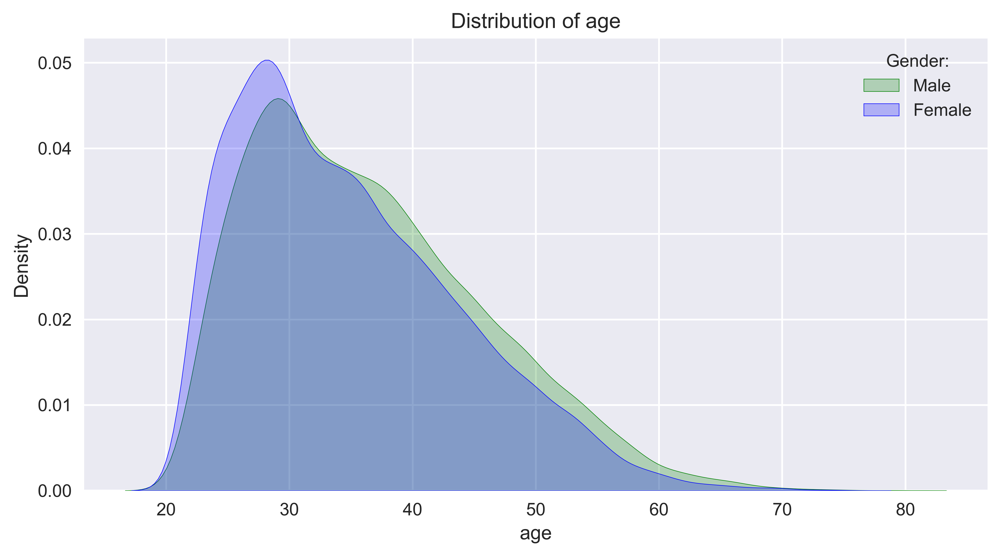

In [12]:
# Create a figure and an axis for the plot
fig, ax = plt.subplots()

# Plot the distribution of age for males
sns.distplot(df.loc[df.sex == 'Male', 'age'].dropna(), 
             hist=False, color='green', 
             kde_kws={'shade': True},
             ax=ax, label='Male')

# Plot the distribution of age for females
sns.distplot(df.loc[df.sex == 'Female', 'age'].dropna(), 
             hist=False, color='blue', 
             kde_kws={'shade': True},
             ax=ax, label='Female')

# Set the title of the plot
ax.set_title('Distribution of age')

# Add a legend with the title 'Gender:'
ax.legend(title='Gender:')

# Adjust the layout to make sure everything fits without overlapping
plt.tight_layout()

# Show the plot
plt.show();

As mentioned in the text, we can create a histogram (together with the KDE), by calling:

C:\Users\USER\AppData\Local\Temp\ipykernel_31048\3470609590.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax = sns.distplot(df.age.dropna())


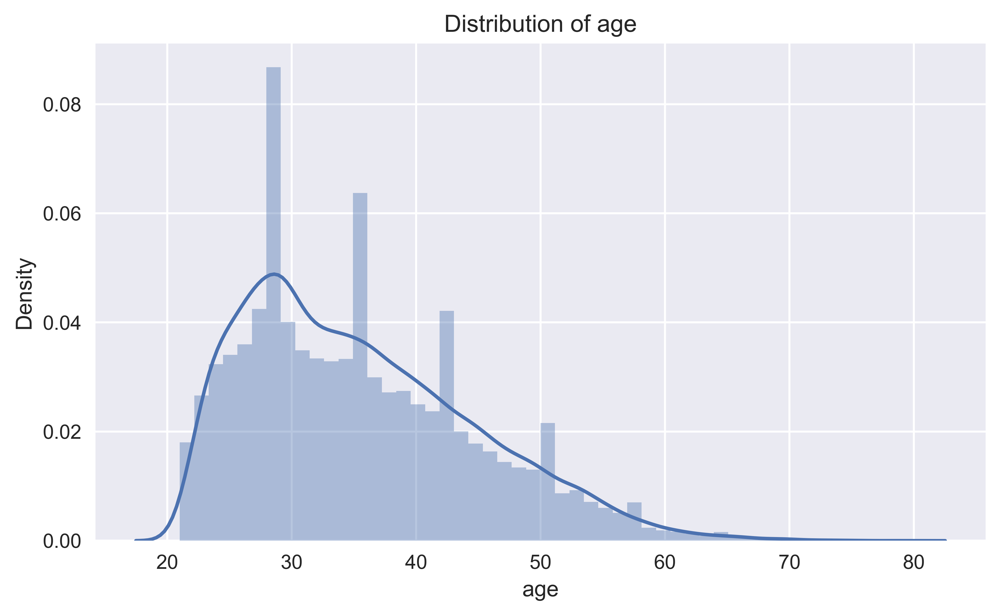

In [13]:
# Plot the distribution of age for the entire dataset
ax = sns.distplot(df.age.dropna())

# Set the title of the plot
ax.set_title('Distribution of age');

We noticed some spikes appearing every ~10 years and the reason for this is the binning. Below, we created the same histogram using `sns.countplot` and `plotly_express`. By doing so, each value of age has a separate bin and we can inspect the plot in detail. There are no such spikes in the following plots:

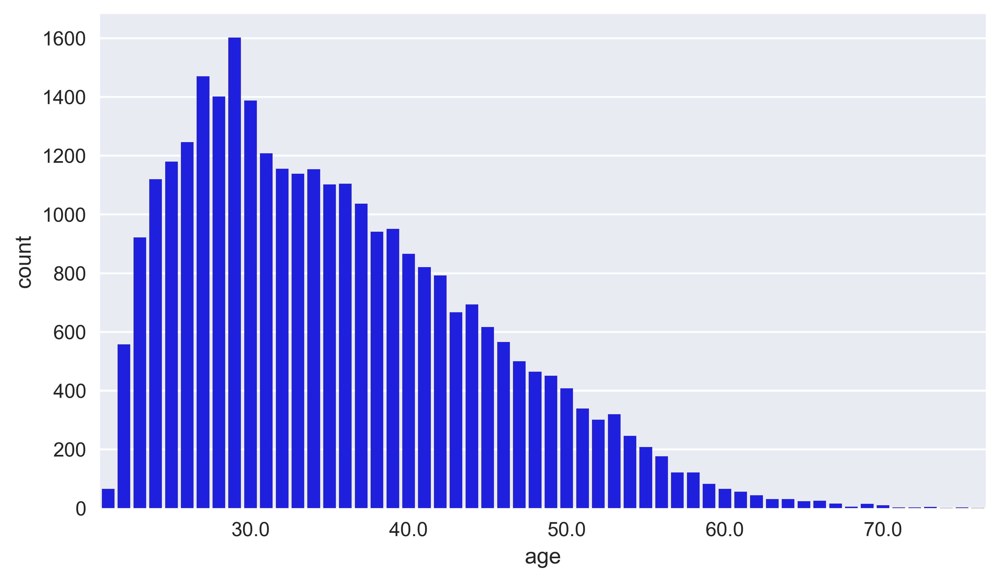

In [14]:
# Plot the count of ages in the dataset
plot_ = sns.countplot(x=df.age.dropna(), color='blue')

# Loop through the x-tick labels and set visibility based on the condition
for ind, label in enumerate(plot_.get_xticklabels()):
    # Convert label text to float and then to int, check if it's divisible by 10
    if int(float(label.get_text())) % 10 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)

In [15]:
px.histogram(df, x='age', title = 'Distribution of age')

5. Plot a `pairplot` of selected variables:

C:\Users\USER\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight

C:\Users\USER\AppData\Local\Temp\ipykernel_31048\3671353675.py:8: UserWarning:

The figure layout has changed to tight



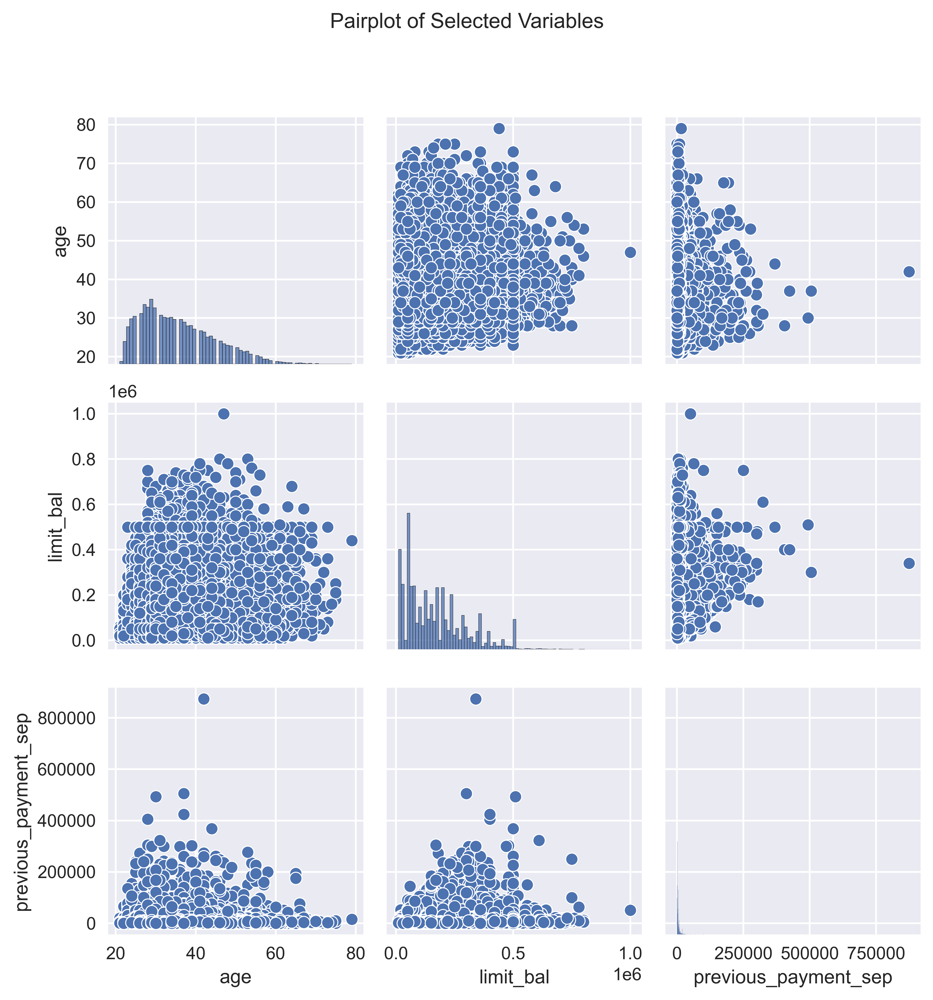

In [16]:
# Create a pairplot of selected variables
pair_plot = sns.pairplot(df[['age', 'limit_bal', 'previous_payment_sep']])

# Add a title to the pairplot
pair_plot.fig.suptitle('Pairplot of Selected Variables', y=1.05)

# Adjust the layout to ensure everything fits without overlapping
plt.tight_layout()

# Display the plot
plt.show()

Additionally, we can separate the genders by specifying the `hue` argument:

In [17]:
# pair_plot = sns.pairplot(df[['sex', 'age', 'limit_bal', 'previous_payment_sep']], 
#                          hue='sex')
# pair_plot.fig.suptitle('Pairplot of selected variables', y=1.05);

6. Define and run a function for plotting the correlation heatmap:

In [18]:
def plot_correlation_matrix(corr_mat):
    '''
    Function for plotting the correlation heatmap. It masks the irrelevant fields.
    
    Parameters
    ----------
    corr_mat : pd.DataFrame
        Correlation matrix of the features.
    '''
    
    # Temporarily change style to white background
    sns.set(style='white')
    
    # Mask the upper triangle
    mask = np.triu(np.ones_like(corr_mat, dtype=bool))
    
    # Set up the matplotlib figure
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Set up custom diverging colormap
    cmap = sns.diverging_palette(240, 10, n=9, as_cmap=True)
    
    # Plot the heatmap
    sns.heatmap(corr_mat, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={'shrink': .5}, ax=ax)
    
    # Set title for the heatmap
    ax.set_title('Correlation Matrix', fontsize=16)
    
    # Change back to darkgrid style
    sns.set(style='darkgrid')
    
    # Adjust layout to fit everything nicely
    plt.tight_layout()

C:\Users\USER\AppData\Local\Temp\ipykernel_31048\2024959926.py:8: UserWarning:

The figure layout has changed to tight



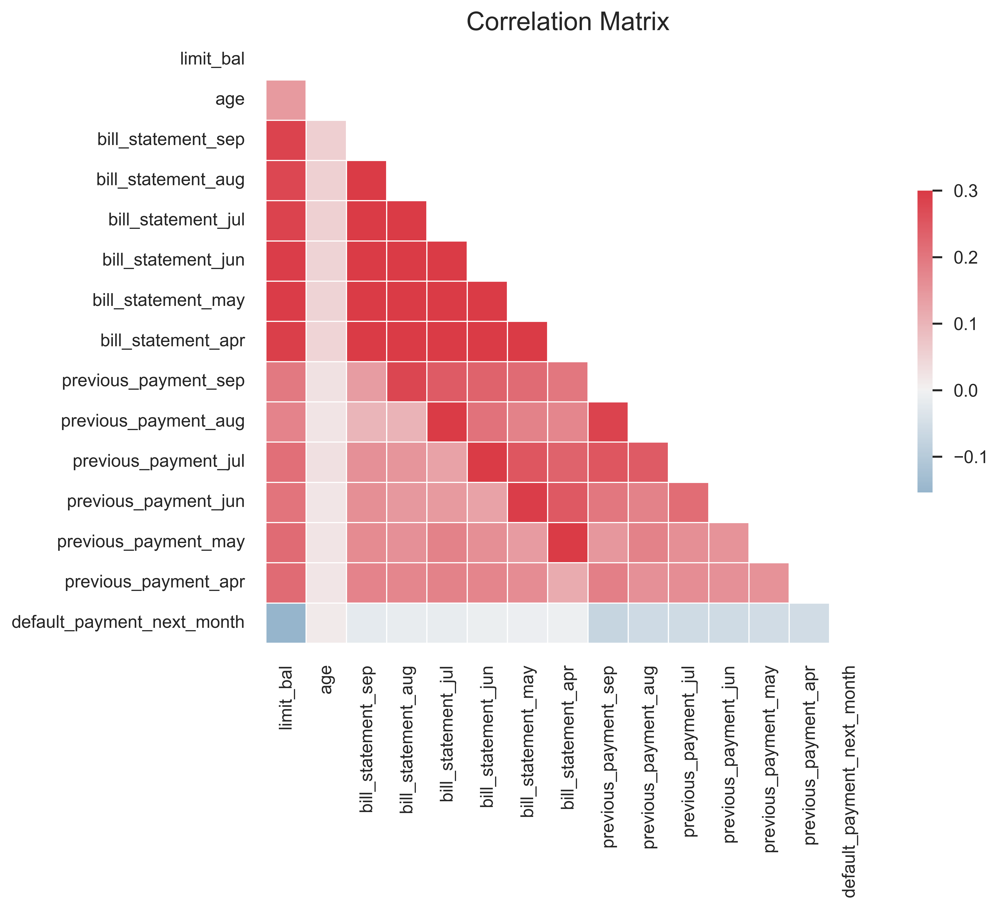

In [19]:
# Calculate the correlation matrix
corr_mat = df.select_dtypes(include='number').corr()    

# Plot the correlation matrix
plot_correlation_matrix(corr_mat)

# Adjust layout to fit everything nicely
plt.tight_layout()

# Display the plot
plt.show()

We can also directly inspect the correlation between the features (numerical) and the target:

In [20]:
df.select_dtypes(include='number').corr()[['default_payment_next_month']]

,default_payment_next_month
limit_bal,-0.153520
age,0.014491
bill_statement_sep,-0.019644
bill_statement_aug,-0.014193
bill_statement_jul,-0.014076
bill_statement_jun,-0.010156
bill_statement_may,-0.006760
bill_statement_apr,-0.005372
previous_payment_sep,-0.072929
previous_payment_aug,-0.058579


7. Plot the distribution of limit balance for each gender and education level:

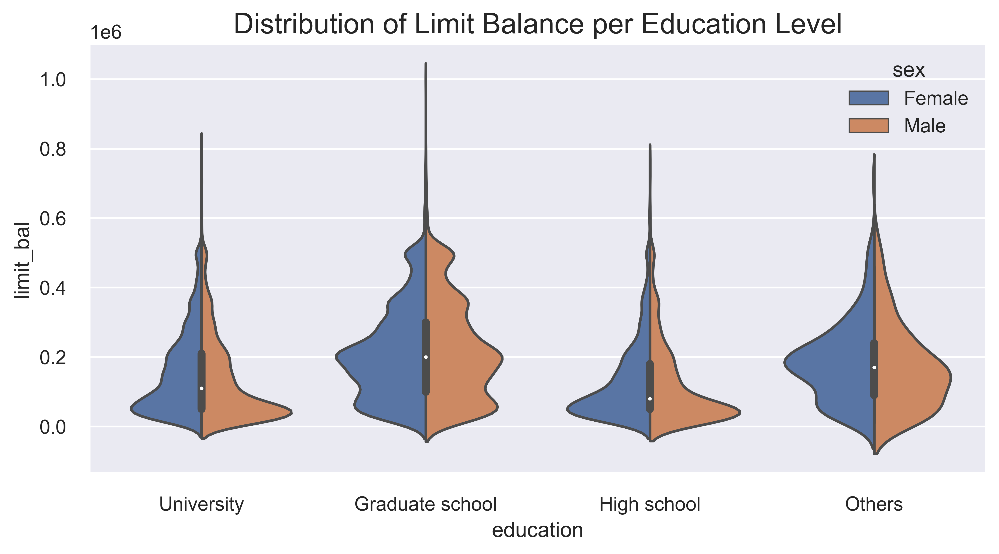

In [21]:
# Create a violin plot
ax = sns.violinplot(x='education', y='limit_bal', 
                    hue='sex', split=True, data=df)

# Set title for the plot
ax.set_title('Distribution of Limit Balance per Education Level', fontsize=16)

# Adjust layout to fit everything nicely
plt.tight_layout()

# Display the plot
plt.show()

The following code plots the same information, without splitting the violin plots.

In [22]:
# ax = sns.violinplot(x='education', y='limit_bal', 
#                     hue='sex', data=df)
# ax.set_title('Distribution of limit balance per education level', 
#              fontsize=16);

8. Investigate the distribution of the target variable per gender and education level:

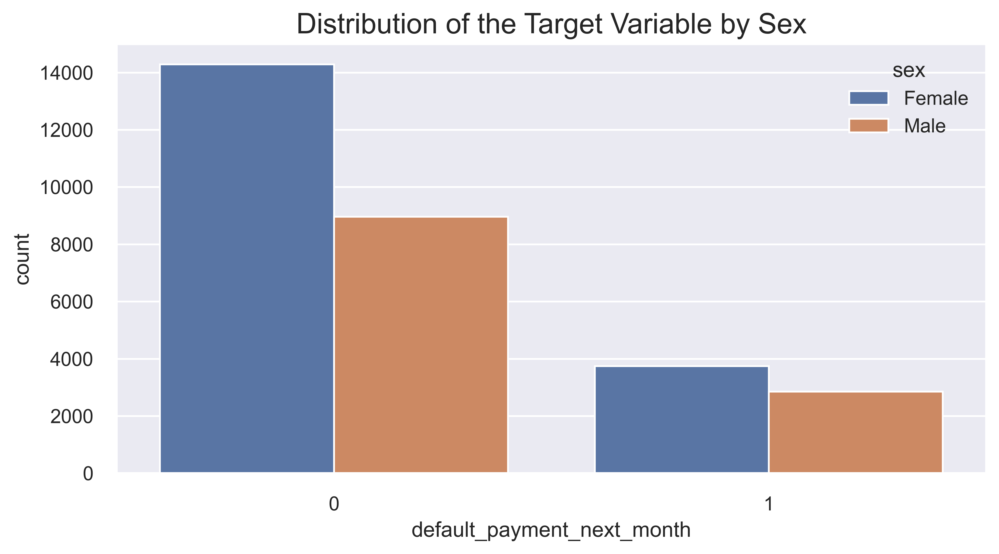

In [23]:
# Create a count plot
ax = sns.countplot(x='default_payment_next_month', hue='sex', data=df)

# Set title for the plot
ax.set_title('Distribution of the Target Variable by Sex', fontsize=16)

# Adjust layout to fit everything nicely
plt.tight_layout()

# Display the plot
plt.show()

9. Investigate the percentage of defaults per education level:

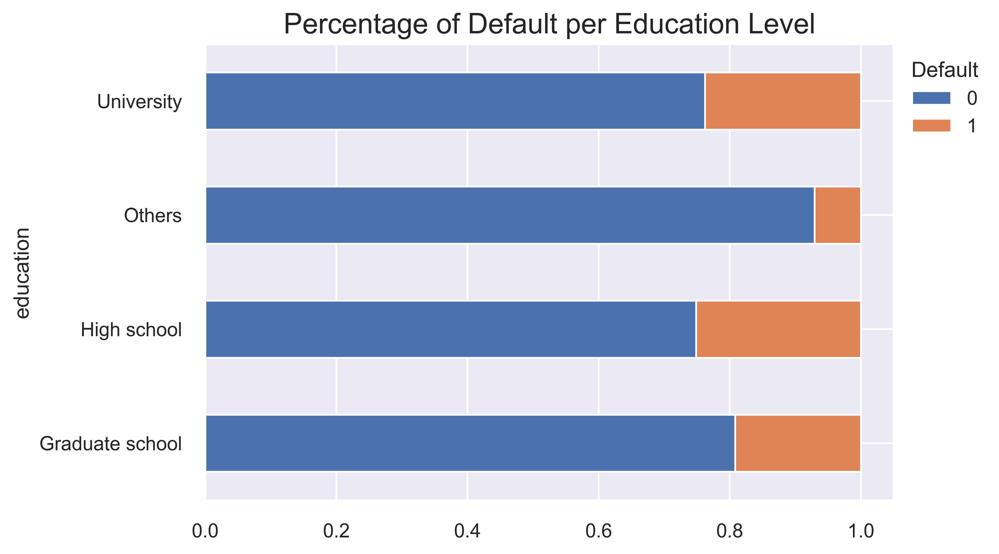

In [24]:
# Group by 'education' and calculate normalized value counts for 'default_payment_next_month'
default_education = df.groupby('education')['default_payment_next_month'].value_counts(normalize=True).unstack()

# Plot the data as a horizontal stacked bar chart
ax = default_education.plot(kind='barh', stacked=True)

# Set the title of the plot
ax.set_title('Percentage of Default per Education Level', fontsize=16)

# Add a legend with the title 'Default' and position it outside the plot
ax.legend(title='Default', bbox_to_anchor=(1, 1))

# Adjust the layout to fit everything nicely
plt.tight_layout()

# Display the plot
plt.show()

## Splitting the data into training and test sets

2. Split the data into training and test sets:

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                   test_size=0.2, 
                                                   random_state=42)

3. Split the data into training and test sets without shuffling:

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                   test_size=0.2, 
                                                   shuffle=False)

4. Split the data into training and test sets with stratification:

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                   test_size=0.2, 
                                                   stratify=y, 
                                                   random_state=42)

5. Verify that the ratio of the target is preserved:

In [28]:
y_train.value_counts(normalize=True)

default_payment_next_month
0    0.778792
1    0.221208
Name: proportion, dtype: float64

In [29]:
y_test.value_counts(normalize=True)

default_payment_next_month
0    0.778833
1    0.221167
Name: proportion, dtype: float64

## Dealing with missing values

2. Inspect the information about the DataFrame:

In [30]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30000 entries, 0 to 29999
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   limit_bal             30000 non-null  int64  
 1   sex                   29850 non-null  object 
 2   education             29850 non-null  object 
 3   marriage              29850 non-null  object 
 4   age                   29850 non-null  float64
 5   payment_status_sep    30000 non-null  object 
 6   payment_status_aug    30000 non-null  object 
 7   payment_status_jul    30000 non-null  object 
 8   payment_status_jun    30000 non-null  object 
 9   payment_status_may    30000 non-null  object 
 10  payment_status_apr    30000 non-null  object 
 11  bill_statement_sep    30000 non-null  int64  
 12  bill_statement_aug    30000 non-null  int64  
 13  bill_statement_jul    30000 non-null  int64  
 14  bill_statement_jun    30000 non-null  int64  
 15  bill_statement_may    30

3. Visualize the nullity of the DataFrame:

In [31]:
missingno.matrix(X)

plt.show()

4. Define columns with missing values per data type:

In [32]:
NUM_FEATURES = ['age']
CAT_FEATURES = ['sex', 'education', 'marriage']

5. Impute the numerical feature:

In [33]:
# Impute missing values in numerical features using the median strategy
for col in NUM_FEATURES:
    # Create the imputer with median strategy
    num_imputer = SimpleImputer(strategy='median')
    
    # Fit the imputer on the training data
    num_imputer.fit(X_train[[col]])
    
    # Transform the training data
    X_train.loc[:, col] = num_imputer.transform(X_train[[col]])
    
    # Transform the test data
    X_test.loc[:, col] = num_imputer.transform(X_test[[col]])

In [34]:
# alternative method using pandas

# for feature in NUM_FEATURES:
#     median_value = X_train[feature].median()
#     X_train.loc[:, feature].fillna(median_value, inplace=True)
#     X_test.loc[:, feature].fillna(median_value, inplace=True)

6. Impute the categorical features:

In [35]:
# Impute missing values in categorical features using the most frequent strategy
for col in CAT_FEATURES:
    # Create the imputer with the most frequent strategy
    cat_imputer = SimpleImputer(strategy='most_frequent')
    
    # Fit the imputer on the training data
    cat_imputer.fit(X_train[[col]])
    
    # Transform the training data
    X_train.loc[:, col] = cat_imputer.transform(X_train[[col]])
    
    # Transform the test data
    X_test.loc[:, col] = cat_imputer.transform(X_test[[col]])

In [36]:
# alternative method using pandas

# for feature in CAT_FEATURES:
#     mode_value = X_train[feature].mode().values[0]
#     X_train.loc[:, feature].fillna(mode_value, inplace=True)
#     X_test.loc[:, feature].fillna(mode_value, inplace=True)

7. Verify that there are no missing values:

In [37]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24000 entries, 22788 to 27126
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   limit_bal             24000 non-null  int64  
 1   sex                   24000 non-null  object 
 2   education             24000 non-null  object 
 3   marriage              24000 non-null  object 
 4   age                   24000 non-null  float64
 5   payment_status_sep    24000 non-null  object 
 6   payment_status_aug    24000 non-null  object 
 7   payment_status_jul    24000 non-null  object 
 8   payment_status_jun    24000 non-null  object 
 9   payment_status_may    24000 non-null  object 
 10  payment_status_apr    24000 non-null  object 
 11  bill_statement_sep    24000 non-null  int64  
 12  bill_statement_aug    24000 non-null  int64  
 13  bill_statement_jul    24000 non-null  int64  
 14  bill_statement_jun    24000 non-null  int64  
 15  bill_statement_may  

## Encoding categorical variables

2. Use Label Encoder to encode a selected column:

In [38]:
# Column to be encoded
COL = 'education'

# Create copies of the training and test datasets
X_train_copy = X_train.copy()
X_test_copy = X_test.copy()

# Initialize the label encoder
label_enc = LabelEncoder()

# Fit the label encoder on the training data
label_enc.fit(X_train_copy[COL])

# Transform the training data
X_train_copy.loc[:, COL] = label_enc.transform(X_train_copy[COL])

# Transform the test data
X_test_copy.loc[:, COL] = label_enc.transform(X_test_copy[COL])

3. Select categorical features for one-hot encoding:

In [39]:
CAT_FEATURES = X_train.select_dtypes(include='object') \
                      .columns \
                      .to_list()

4. Instantiate the One-Hot Encoder object:

In [40]:
one_hot_encoder = OneHotEncoder(handle_unknown='error', 
                               drop='first')

5. Create the column transformer using the one-hot encoder: 

In [41]:
one_hot_transformer = ColumnTransformer(
    [("one_hot", one_hot_encoder, CAT_FEATURES)]
    #,remainder='passthrough'
)

6. Fit the transformer:

In [42]:
one_hot_transformer.fit(X_train)

ColumnTransformer(transformers=[('one_hot', OneHotEncoder(drop='first'),
                                 ['sex', 'education', 'marriage',
                                  'payment_status_sep', 'payment_status_aug',
                                  'payment_status_jul', 'payment_status_jun',
                                  'payment_status_may',
                                  'payment_status_apr'])])

7. Apply the transformations to both training and test sets:

In [43]:
# Extract the OneHotEncoder from the ColumnTransformer
ohe = one_hot_transformer.named_transformers_['one_hot']

# Get feature names from the OneHotEncoder
col_names = ohe.get_feature_names_out(CAT_FEATURES)

# Transform the training data
X_train_cat = pd.DataFrame(ohe.transform(X_train[CAT_FEATURES]).toarray(),
                           columns=col_names, 
                           index=X_train.index)

# Concatenate the original training data (excluding the categorical features) with the one-hot encoded data
X_train_ohe = pd.concat([X_train.drop(CAT_FEATURES, axis=1), X_train_cat], axis=1)

# Transform the test data
X_test_cat = pd.DataFrame(ohe.transform(X_test[CAT_FEATURES]).toarray(), 
                          columns=col_names, 
                          index=X_test.index)

# Concatenate the original test data (excluding the categorical features) with the one-hot encoded data
X_test_ohe = pd.concat([X_test.drop(CAT_FEATURES, axis=1), X_test_cat], axis=1)

## Fitting a decision tree classifier

2. Create the instance of the model, fit it to the training data and create prediction:

In [44]:
# Initialize the DecisionTreeClassifier with a fixed random state for reproducibility
tree_classifier = DecisionTreeClassifier(random_state=42)

# Fit the classifier on the one-hot encoded training data
tree_classifier.fit(X_train_ohe, y_train)

# Make predictions on the one-hot encoded test data
y_pred = tree_classifier.predict(X_test_ohe)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.72


In [45]:
# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.81      0.82      4673
           1       0.37      0.40      0.39      1327

    accuracy                           0.72      6000
   macro avg       0.60      0.61      0.60      6000
weighted avg       0.73      0.72      0.72      6000



3. Evaluate the results:

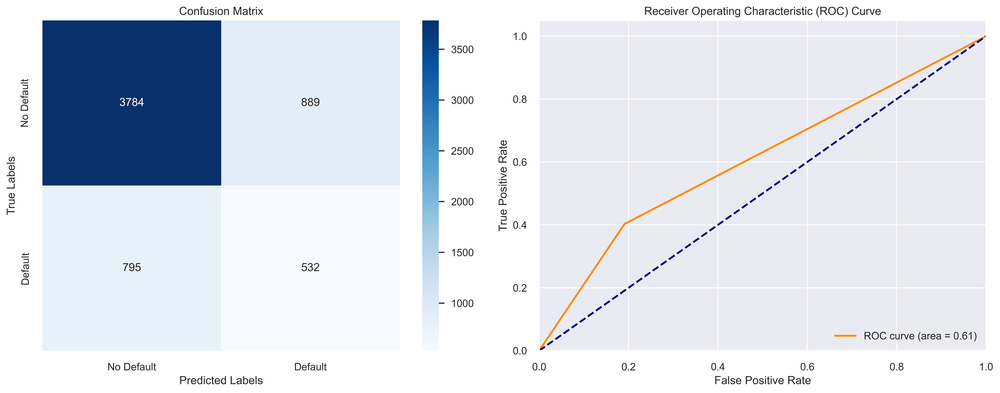

<Figure size 2400x1350 with 0 Axes>

In [46]:
# Function to evaluate model performance
def performance_evaluation_report(model, X_test, y_test, labels=None, show_plot=True):
    """
    Evaluates the performance of a classification model on the test data.
    
    Parameters
    ----------
    model : sklearn classifier
        The trained classifier to evaluate.
    X_test : pd.DataFrame or np.ndarray
        The test features.
    y_test : pd.Series or np.ndarray
        The true labels for the test data.
    labels : list, optional
        List of label names for the classification report.
    show_plot : bool, optional
        Whether to display the confusion matrix and ROC curve plots.
        
    Returns
    -------
    report : dict
        A dictionary containing the classification report.
    """
    # Predict the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    
    # Generate the classification report
    report = classification_report(y_test, y_pred, target_names=labels, output_dict=True)
    
    if show_plot:
        fig, ax = plt.subplots(1, 2, figsize=(15, 6))
        
        # Confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels, ax=ax[0])
        ax[0].set_xlabel('Predicted Labels')
        ax[0].set_ylabel('True Labels')
        ax[0].set_title('Confusion Matrix')
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        roc_auc = auc(fpr, tpr)
        ax[1].plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        ax[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        ax[1].set_xlim([0.0, 1.0])
        ax[1].set_ylim([0.0, 1.05])
        ax[1].set_xlabel('False Positive Rate')
        ax[1].set_ylabel('True Positive Rate')
        ax[1].set_title('Receiver Operating Characteristic (ROC) Curve')
        ax[1].legend(loc='lower right')
        
        plt.tight_layout()
        plt.show()
    
    return report

# Define the labels for the classification report and confusion matrix
LABELS = ['No Default', 'Default']

# Evaluate the performance of the decision tree pipeline on the test data
tree_perf = performance_evaluation_report(tree_classifier, 
                                          X_test_ohe, 
                                          y_test, 
                                          labels=LABELS, 
                                          show_plot=True)

# Adjust layout to ensure everything fits without overlapping
plt.tight_layout()

# Display the plots
plt.show();

In [47]:
tree_perf

{'No Default': {'precision': 0.8263813059620004,
  'recall': 0.8097581853199229,
  'f1-score': 0.8179853004755728,
  'support': 4673.0},
 'Default': {'precision': 0.37438423645320196,
  'recall': 0.400904295403165,
  'f1-score': 0.38719068413391555,
  'support': 1327.0},
 'accuracy': 0.7193333333333334,
 'macro avg': {'precision': 0.6003827712076012,
  'recall': 0.605331240361544,
  'f1-score': 0.6025879923047441,
  'support': 6000.0},
 'weighted avg': {'precision': 0.7264146207556378,
  'recall': 0.7193333333333334,
  'f1-score': 0.722707891161343,
  'support': 6000.0}}

4. Plot the simplified Decision Tree:

In [48]:
import os

# Ensure the GraphViz path is correctly specified
# Change the path to the location where GraphViz is installed on your system
os.environ["PATH"] += os.pathsep + 'C:/Program Files/Graphviz/bin'

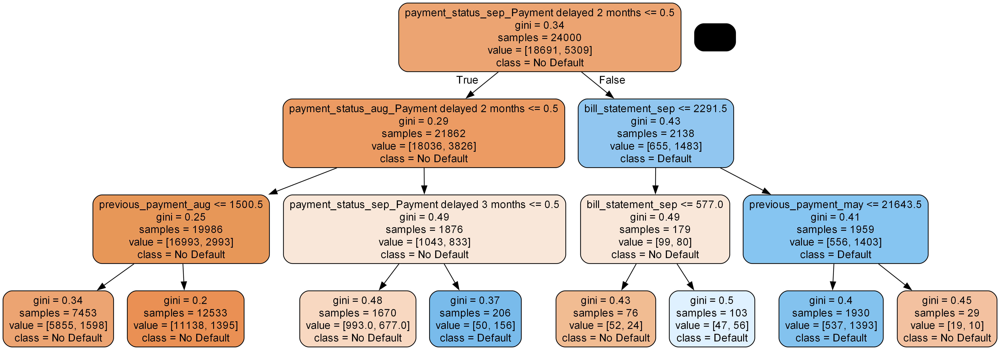

In [49]:
# Initialize a DecisionTreeClassifier with a maximum depth of 3 for simplicity and reproducibility
small_tree = DecisionTreeClassifier(max_depth=3, random_state=42)

# Fit the classifier on the one-hot encoded training data
small_tree.fit(X_train_ohe, y_train)

# Initialize a StringIO object to hold the DOT data
tree_dot = StringIO()

# Export the decision tree in DOT format
export_graphviz(small_tree, out_file=tree_dot, 
                feature_names=X_train_ohe.columns,
                class_names=LABELS, 
                rounded=True, 
                proportion=False, 
                precision=2, 
                filled=True)

# Create a graph from the DOT data
tree_graph = pydotplus.graph_from_dot_data(tree_dot.getvalue())

# Set the resolution of the output image
tree_graph.set_dpi(300)

# Display the decision tree as an image
graph_png = tree_graph.create_png()
Image(graph_png)

## Implementing scikit-learn's pipelines

2. Load the data, separate the target and create the stratified train-test split:

In [50]:
# Load the dataset
df = pd.read_csv('credit_card_default.csv', index_col=0, na_values='')

# Create feature matrix X and target vector y
X = df.copy()  # Copy the DataFrame to X
y = X.pop('default_payment_next_month')

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2,
                                                    stratify=y,
                                                    random_state=42)

# Identify numerical features in the training data
num_features = X_train.select_dtypes(include='number').columns.to_list()

# Identify categorical features in the training data
cat_features = X_train.select_dtypes(include='object').columns.to_list()

# Create a numerical preprocessing pipeline
num_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median'))
])

# Create a list of unique categories for each categorical feature
cat_list = [list(X_train[col].dropna().unique()) for col in cat_features]

# Create a categorical preprocessing pipeline
cat_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(categories=cat_list, 
                             handle_unknown='error', drop='first'))
])

# Create a column transformer to preprocess both numerical and categorical features
preprocessor = ColumnTransformer(
    transformers=[
        ('numerical', num_pipeline, num_features), 
        ('categorical', cat_pipeline, cat_features)
    ],
    remainder='drop'
)

7. Create the joint pipeline:

In [51]:
# Initialize a DecisionTreeClassifier
dec_tree = DecisionTreeClassifier(random_state=42)

# Create a pipeline that includes the preprocessor and the classifier
tree_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', dec_tree)
])

# Fit the pipeline on the training data
tree_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['limit_bal', 'age',
                                                   'bill_statement_sep',
                                                   'bill_statement_aug',
                                                   'bill_statement_jul',
                                                   'bill_statement_jun',
                                                   'bill_statement_may',
                                                   'bill_statement_apr',
                                                   'previous_payment_sep',
                                                   'previous_payment_aug',
                                                   'previous_payment_j...
                                                                                              'Payment '
                                                                                              'delayed '
                                                                                              '3 '
                                                                                              'months',
                                                                                              'Payment '
                                                                                              'delayed '
                                                                                              '7 '
                                                                                              'months',
                                                                                              'Payment '
                                                                                              'delayed '
                                                                                              '5 '
                                                                                              'months',
                                                                                              'Payment '
                                                                                              'delayed '
                                                                                              '8 '
                                                                                              'months']],
                                                                                 drop='first'))]),
                                                  ['sex', 'education',
                                                   'marriage',
                                                   'payment_status_sep',
                                                   'payment_status_aug',
                                                   'payment_status_jul',
                                                   'payment_status_jun',
                                                   'payment_status_may',
                                                   'payment_status_apr'])])),
                ('classifier', DecisionTreeClassifier(random_state=42))])

9. Evaluate the performance of the entire pipeline:

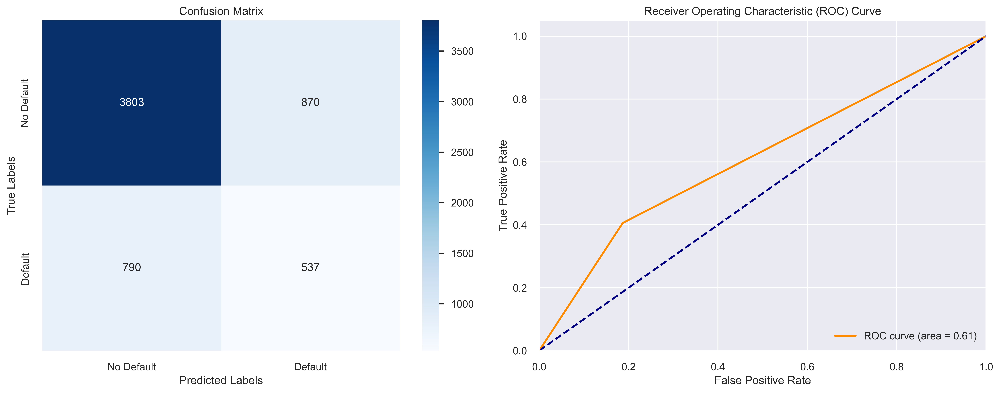

<Figure size 2400x1350 with 0 Axes>

In [52]:
# Function to evaluate model performance
def performance_evaluation_report(model, X_test, y_test, labels=None, show_plot=True):
    """
    Evaluates the performance of a classification model on the test data.
    
    Parameters
    ----------
    model : sklearn classifier
        The trained classifier to evaluate.
    X_test : pd.DataFrame or np.ndarray
        The test features.
    y_test : pd.Series or np.ndarray
        The true labels for the test data.
    labels : list, optional
        List of label names for the classification report.
    show_plot : bool, optional
        Whether to display the confusion matrix and ROC curve plots.
        
    Returns
    -------
    report : dict
        A dictionary containing the classification report.
    """
    # Predict the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    
    # Generate the classification report
    report = classification_report(y_test, y_pred, target_names=labels, output_dict=True)
    
    if show_plot:
        fig, ax = plt.subplots(1, 2, figsize=(15, 6))
        
        # Confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels, ax=ax[0])
        ax[0].set_xlabel('Predicted Labels')
        ax[0].set_ylabel('True Labels')
        ax[0].set_title('Confusion Matrix')
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        roc_auc = auc(fpr, tpr)
        ax[1].plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        ax[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        ax[1].set_xlim([0.0, 1.0])
        ax[1].set_ylim([0.0, 1.05])
        ax[1].set_xlabel('False Positive Rate')
        ax[1].set_ylabel('True Positive Rate')
        ax[1].set_title('Receiver Operating Characteristic (ROC) Curve')
        ax[1].legend(loc='lower right')
        
        plt.tight_layout()
        plt.show()
    
    return report

# Define labels for the classification report
LABELS = ['No Default', 'Default']

# Evaluate the performance of the decision tree pipeline on the test data
tree_perf = performance_evaluation_report(tree_pipeline, X_test, y_test, labels=LABELS, show_plot=True)

plt.tight_layout()
plt.show()

In [53]:
tree_perf

{'No Default': {'precision': 0.8279991291095145,
  'recall': 0.8138240958698909,
  'f1-score': 0.8208504208935895,
  'support': 4673.0},
 'Default': {'precision': 0.3816631130063966,
  'recall': 0.4046721929163527,
  'f1-score': 0.3928310168251646,
  'support': 1327.0},
 'accuracy': 0.7233333333333334,
 'macro avg': {'precision': 0.6048311210579556,
  'recall': 0.6092481443931218,
  'f1-score': 0.6068407188593771,
  'support': 6000.0},
 'weighted avg': {'precision': 0.7292844802147083,
  'recall': 0.7233333333333334,
  'f1-score': 0.7261867960271229,
  'support': 6000.0}}

## Tuning hyperparameters using grid search and cross-validation

2. Define the cross-validation scheme:

In [54]:
k_fold = StratifiedKFold(5, shuffle=True, random_state=42)

3. Evaluate the pipeline using cross-validation:

In [55]:
cross_val_score(tree_pipeline, X_train, y_train, cv=k_fold)

array([0.71833333, 0.73354167, 0.72375   , 0.72770833, 0.71833333])

4. Add extra metrics to cross-validation:

In [56]:
cross_validate(tree_pipeline, X_train, y_train, cv=k_fold, 
              scoring=['accuracy', 'precision', 'recall', 
                      'roc_auc'])

{'fit_time': array([4.61759186, 4.12282705, 4.18901205, 4.15541005, 4.22584295]),
 'score_time': array([0.12641883, 0.12064147, 0.12275267, 0.12224841, 0.1238749 ]),
 'test_accuracy': array([0.71833333, 0.73354167, 0.72375   , 0.72770833, 0.71833333]),
 'test_precision': array([0.37742207, 0.40269058, 0.38561525, 0.39319965, 0.37325175]),
 'test_recall': array([0.42224317, 0.42278719, 0.41902072, 0.42467043, 0.40207156]),
 'test_roc_auc': array([0.61206659, 0.62215411, 0.61497054, 0.6200036 , 0.6053901 ])}

5. Define the parameter grid:

In [57]:
param_grid = {'classifier__criterion': ['entropy', 'gini'],
             'classifier__max_depth': range(3, 11),
             'classifier__min_samples_leaf': range(2, 11)}

6. Run Grid Search:

In [58]:
classifier_gs = GridSearchCV(tree_pipeline, param_grid, scoring='recall', 
                            cv=k_fold, n_jobs=-1, verbose=1)

classifier_gs.fit(X_train, y_train)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('numerical',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median'))]),
                                                                         ['limit_bal',
                                                                          'age',
                                                                          'bill_statement_sep',
                                                                          'bill_statement_aug',
                                                                          'bill_statement_jul',
                                                                          'bill_statement_jun',
                                                                          'bill_statement_may',
                                                                          'bi...
                                                                          'payment_status_sep',
                                                                          'payment_status_aug',
                                                                          'payment_status_jul',
                                                                          'payment_status_jun',
                                                                          'payment_status_may',
                                                                          'payment_status_apr'])])),
                                       ('classifier',
                                        DecisionTreeClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'classifier__criterion': ['entropy', 'gini'],
                         'classifier__max_depth': range(3, 11),
                         'classifier__min_samples_leaf': range(2, 11)},
             scoring='recall', verbose=1)

In [59]:
print(f'Best parameters: {classifier_gs.best_params_}') 
print(f'Recall (Training set): {classifier_gs.best_score_:.4f}') 
print(f'Recall (Test set): {metrics.recall_score(y_test, classifier_gs.predict(X_test)):.4f}')

Best parameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 7}
Recall (Training set): 0.3858
Recall (Test set): 0.3775


7. Evaluate the performance of the Grid Search:

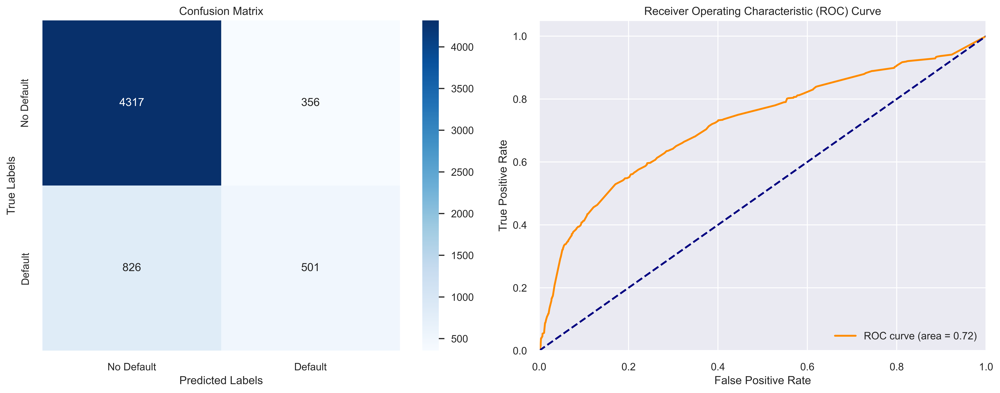

<Figure size 2400x1350 with 0 Axes>

In [60]:
# Function to evaluate model performance
def performance_evaluation_report(model, X_test, y_test, labels=None, show_plot=True):
    """
    Evaluates the performance of a classification model on the test data.
    
    Parameters
    ----------
    model : sklearn classifier
        The trained classifier to evaluate.
    X_test : pd.DataFrame or np.ndarray
        The test features.
    y_test : pd.Series or np.ndarray
        The true labels for the test data.
    labels : list, optional
        List of label names for the classification report.
    show_plot : bool, optional
        Whether to display the confusion matrix and ROC curve plots.
        
    Returns
    -------
    report : dict
        A dictionary containing the classification report.
    """
    # Predict the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    
    # Generate the classification report
    report = classification_report(y_test, y_pred, target_names=labels, output_dict=True)
    
    if show_plot:
        fig, ax = plt.subplots(1, 2, figsize=(15, 6))
        
        # Confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels, ax=ax[0])
        ax[0].set_xlabel('Predicted Labels')
        ax[0].set_ylabel('True Labels')
        ax[0].set_title('Confusion Matrix')
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        roc_auc = auc(fpr, tpr)
        ax[1].plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        ax[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        ax[1].set_xlim([0.0, 1.0])
        ax[1].set_ylim([0.0, 1.05])
        ax[1].set_xlabel('False Positive Rate')
        ax[1].set_ylabel('True Positive Rate')
        ax[1].set_title('Receiver Operating Characteristic (ROC) Curve')
        ax[1].legend(loc='lower right')
        
        plt.tight_layout()
        plt.show()
    
    return report

# Define labels for the classification report
LABELS = ['No Default', 'Default']

# Evaluate the performance of the decision tree pipeline on the test data
tree_gs_perf = performance_evaluation_report(classifier_gs, X_test, 
                                            y_test, labels=LABELS, 
                                            show_plot=True)

plt.tight_layout()
plt.show()

In [61]:
tree_gs_perf

{'No Default': {'precision': 0.8393933501847171,
  'recall': 0.9238176760111277,
  'f1-score': 0.8795843520782396,
  'support': 4673.0},
 'Default': {'precision': 0.5845974329054843,
  'recall': 0.3775433308214017,
  'f1-score': 0.45879120879120877,
  'support': 1327.0},
 'accuracy': 0.803,
 'macro avg': {'precision': 0.7119953915451007,
  'recall': 0.6506805034162647,
  'f1-score': 0.6691877804347242,
  'support': 6000.0},
 'weighted avg': {'precision': 0.7830409864797935,
  'recall': 0.803,
  'f1-score': 0.7865189352212579,
  'support': 6000.0}}

8. Run Randomized Grid Search:

In [62]:
classifier_rs = RandomizedSearchCV(tree_pipeline, param_grid, scoring='recall', 
                                  cv=k_fold, n_jobs=-1, verbose=1, 
                                  n_iter=100, random_state=42)
classifier_rs.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('numerical',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer(strategy='median'))]),
                                                                               ['limit_bal',
                                                                                'age',
                                                                                'bill_statement_sep',
                                                                                'bill_statement_aug',
                                                                                'bill_statement_jul',
                                                                                'bill_statement_jun',
                                                                                'bill_statement_ma...
                                                                                'payment_status_jul',
                                                                                'payment_status_jun',
                                                                                'payment_status_may',
                                                                                'payment_status_apr'])])),
                                             ('classifier',
                                              DecisionTreeClassifier(random_state=42))]),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'classifier__criterion': ['entropy',
                                                                  'gini'],
                                        'classifier__max_depth': range(3, 11),
                                        'classifier__min_samples_leaf': range(2, 11)},
                   random_state=42, scoring='recall', verbose=1)

In [63]:
print(f'Best parameters: {classifier_rs.best_params_}') 
print(f'Recall (Training set): {classifier_rs.best_score_:.4f}') 
print(f'Recall (Test set): {metrics.recall_score(y_test, classifier_rs.predict(X_test)):.4f}')

Best parameters: {'classifier__min_samples_leaf': 7, 'classifier__max_depth': 10, 'classifier__criterion': 'gini'}
Recall (Training set): 0.3858
Recall (Test set): 0.3775


9. Evaluate the performance of the Randomized Grid Search:

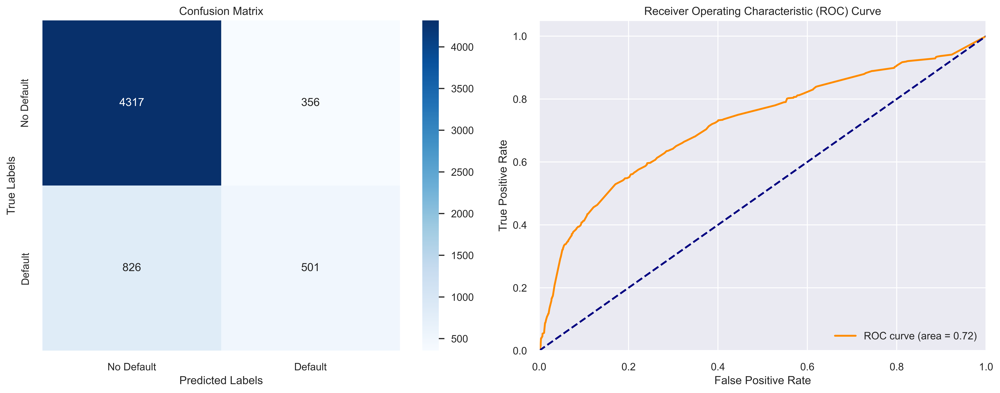

<Figure size 2400x1350 with 0 Axes>

In [64]:
# Function to evaluate model performance
def performance_evaluation_report(model, X_test, y_test, labels=None, show_plot=True):
    """
    Evaluates the performance of a classification model on the test data.
    
    Parameters
    ----------
    model : sklearn classifier
        The trained classifier to evaluate.
    X_test : pd.DataFrame or np.ndarray
        The test features.
    y_test : pd.Series or np.ndarray
        The true labels for the test data.
    labels : list, optional
        List of label names for the classification report.
    show_plot : bool, optional
        Whether to display the confusion matrix and ROC curve plots.
        
    Returns
    -------
    report : dict
        A dictionary containing the classification report.
    """
    # Predict the test data
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    
    # Generate the classification report
    report = classification_report(y_test, y_pred, target_names=labels, output_dict=True)
    
    if show_plot:
        fig, ax = plt.subplots(1, 2, figsize=(15, 6))
        
        # Confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels, ax=ax[0])
        ax[0].set_xlabel('Predicted Labels')
        ax[0].set_ylabel('True Labels')
        ax[0].set_title('Confusion Matrix')
        
        # ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        roc_auc = auc(fpr, tpr)
        ax[1].plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        ax[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        ax[1].set_xlim([0.0, 1.0])
        ax[1].set_ylim([0.0, 1.05])
        ax[1].set_xlabel('False Positive Rate')
        ax[1].set_ylabel('True Positive Rate')
        ax[1].set_title('Receiver Operating Characteristic (ROC) Curve')
        ax[1].legend(loc='lower right')
        
        plt.tight_layout()
        plt.show()
    
    return report

# Define labels for the classification report
LABELS = ['No Default', 'Default']

# Evaluate the performance of the decision tree pipeline on the test data
tree_rs_perf = performance_evaluation_report(classifier_rs, X_test, 
                                            y_test, labels=LABELS, 
                                            show_plot=True)

plt.tight_layout()
plt.show()

In [65]:
tree_rs_perf

{'No Default': {'precision': 0.8393933501847171,
  'recall': 0.9238176760111277,
  'f1-score': 0.8795843520782396,
  'support': 4673.0},
 'Default': {'precision': 0.5845974329054843,
  'recall': 0.3775433308214017,
  'f1-score': 0.45879120879120877,
  'support': 1327.0},
 'accuracy': 0.803,
 'macro avg': {'precision': 0.7119953915451007,
  'recall': 0.6506805034162647,
  'f1-score': 0.6691877804347242,
  'support': 6000.0},
 'weighted avg': {'precision': 0.7830409864797935,
  'recall': 0.803,
  'f1-score': 0.7865189352212579,
  'support': 6000.0}}